## Capstone Project - The Battle of Neighborhoods
##### Comparing two cities: Toronto and New York City

# --------------------------------------------------------------------------------------------------------
# PART 1: CREATE TORONTO DATASET
# --------------------------------------------------------------------------------------------------------

### Step 1: install packages

In [1]:
import pip

package_names=['geocoder','requests','html5lib','lxml','beautifulsoup4'] #packages to install
pip.main(['install'] + package_names + ['--upgrade']) 

!conda install -c conda-forge folium=0.5.0 --yes 
!conda install -c conda-forge geopy --yes 
print("")
print("***************************************************")
print("****************packages installed!****************")
print("***************************************************")
print("")

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Requirement already up-to-date: geocoder in c:\users\harsh\anaconda3\lib\site-packages (1.38.1)
Requirement already up-to-date: requests in c:\users\harsh\anaconda3\lib\site-packages (2.23.0)
Requirement already up-to-date: html5lib in c:\users\harsh\anaconda3\lib\site-packages (1.0.1)
Requirement already up-to-date: lxml in c:\users\harsh\anaconda3\lib\site-packages (4.5.0)
Requirement already up-to-date: beautifulsoup4 in c:\users\harsh\anaconda3\lib\site-packages (4.9.0)
Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.


***************************************************
****************packages installed!****************
***************************************************



### Step 2: import libraries

In [385]:
from bs4 import BeautifulSoup # library to import data from a webpage
import requests #library to allow you to send HTTP requests using Python.
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
import geocoder # library for converting postcodes into long/lat geocodes
import matplotlib.cm as cm # Matplotlib and associated plotting modules
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans # import k-means from clustering stage
import folium # map rendering library
import json # library to handle JSON files
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

### Step 3: import data from wikipedia

In [4]:
source = requests.get('https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M').text
soup = BeautifulSoup(source,'lxml')
table = soup.find('table', class_='wikitable sortable')
table

<table class="wikitable sortable">
<tbody><tr>
<th>Postal code
</th>
<th>Borough
</th>
<th>Neighborhood
</th></tr>
<tr>
<td>M1A
</td>
<td>Not assigned
</td>
<td>
</td></tr>
<tr>
<td>M2A
</td>
<td>Not assigned
</td>
<td>
</td></tr>
<tr>
<td>M3A
</td>
<td>North York
</td>
<td>Parkwoods
</td></tr>
<tr>
<td>M4A
</td>
<td>North York
</td>
<td>Victoria Village
</td></tr>
<tr>
<td>M5A
</td>
<td>Downtown Toronto
</td>
<td>Regent Park / Harbourfront
</td></tr>
<tr>
<td>M6A
</td>
<td>North York
</td>
<td>Lawrence Manor / Lawrence Heights
</td></tr>
<tr>
<td>M7A
</td>
<td>Downtown Toronto
</td>
<td>Queen's Park / Ontario Provincial Government
</td></tr>
<tr>
<td>M8A
</td>
<td>Not assigned
</td>
<td>
</td></tr>
<tr>
<td>M9A
</td>
<td>Etobicoke
</td>
<td>Islington Avenue
</td></tr>
<tr>
<td>M1B
</td>
<td>Scarborough
</td>
<td>Malvern / Rouge
</td></tr>
<tr>
<td>M2B
</td>
<td>Not assigned
</td>
<td>
</td></tr>
<tr>
<td>M3B
</td>
<td>North York
</td>
<td>Don Mills
</td></tr>
<tr>
<td>M4B
</td>
<td>Ea

### Step 4: read data into a dataframe and clean up

In [5]:
#instantiate dataframe
df = pd.DataFrame(columns=['PostalCode', 'Borough', 'Neighborhood'])

#initialise counters
col_counter = 0
row_counter = 0

#populate dataframe with wiki table values
for row in table.find_all('tr'):           #iterate along rows
    for cell in row.find_all('td'):        #iterate along columns
        col_counter += 1
        if col_counter == 1: 
            PC = cell.text.strip()         #assign PostalCode value to temporary variable
        if col_counter == 2: 
            BR = cell.text.strip()         #assign Borough value to temporary variable
            if BR == "Not assigned": 
                col_counter = 0            #re-initialise column counter, since we will jump to the first column of new row
                row_counter += 1           #increment row counter
                break                      #exit for loop and step into next row or 'tr' tag if Borough is unassigned
        if col_counter == 3:
            NH = BR                        #assign Borough value to temporary Neighborhood variable
            NH = cell.text.strip()         #overwrite Borough value with Neighborhood value (if not none)
            df.loc[row_counter] = PC,BR,NH #assign values from 3 temporary variables into row cells of dataframe
            col_counter = 0                #re-initialise column counter
            row_counter += 1               #increment row counter

#sort table by Postal Code, Borough, Neighborhood
df.sort_values(by=['PostalCode', 'Borough', 'Neighborhood'], inplace=True)

#replace "/" separators in Neighborhood to ","
df['Neighborhood'] = df['Neighborhood'].str.replace('/', ',' ) 

#reset index values to start from 0
df.reset_index(drop=True, inplace=True) 

### Step 5: Check table for duplicate Postal Codes and display table dimensions 

In [6]:
#Test for duplicate values in PostalCode
print("Are there unique values in PostalCode? ", df['PostalCode'].is_unique) 

#Output table dimensions (row, col)
print(df.shape)

Are there unique values in PostalCode?  True
(103, 3)


In [7]:
#Output table
df.head()

,PostalCode,Borough,Neighborhood
0,M1B,Scarborough,"Malvern , Rouge"
1,M1C,Scarborough,"Rouge Hill , Port Union , Highland Creek"
2,M1E,Scarborough,"Guildwood , Morningside , West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae


# --------------------------------------------------------------------------------------------------------
# PART 2a: OBTAIN AND MERGE TORONTO DATA WITH LOCATION DATA
# --------------------------------------------------------------------------------------------------------

### Step 6: Obtain and merge geocode data

In [8]:
#TRIED THIS TECHNIQUE, BUT DOESNT RETURN VALUES, SO USING SUPPLIED CSV INSTEAD

    # initialize your variable to None
    #lat_lng_coords = None

    # loop until you get the coordinates
    #while(lat_lng_coords is None):
      #geo = geocoder.google('{}, Toronto, Ontario'.format('M1B'))
      #lat_lng_coords = geo.latlng

    #latitude = lat_lng_coords[0]
    #longitude = lat_lng_coords[1]

    #print("latitude,longitude")

geo = pd.read_csv('https://cocl.us/Geospatial_data')
geo.rename(columns = {'Postal Code':'PostalCode'}, inplace = True) 
print('Data downloaded!')
geo.head()

Data downloaded!


,PostalCode,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [9]:
df = df.merge(geo, on='PostalCode', how='left', indicator=False)
df

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M1B,Scarborough,"Malvern , Rouge",43.806686,-79.194353
1,M1C,Scarborough,"Rouge Hill , Port Union , Highland Creek",43.784535,-79.160497
2,M1E,Scarborough,"Guildwood , Morningside , West Hill",43.763573,-79.188711
3,M1G,Scarborough,Woburn,43.770992,-79.216917
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476
...,...,...,...,...,...
98,M9N,York,Weston,43.706876,-79.518188
99,M9P,Etobicoke,Westmount,43.696319,-79.532242
100,M9R,Etobicoke,"Kingsview Village , St. Phillips , Martin Grov...",43.688905,-79.554724
101,M9V,Etobicoke,"South Steeles , Silverstone , Humbergate , Jam...",43.739416,-79.588437


# --------------------------------------------------------------------------------------------------------
# PART 2b: OBTAIN TORONTO VENUE DATA
# --------------------------------------------------------------------------------------------------------


### Step 7: Obtain venue data from neighborhoods in Toronto, and clean up data

In [33]:
CLIENT_ID = 'TKHE5SGMN2M4L55K4U1GEWEX4BK1ZSAO0JQCAFANS0OLSB2O' # your Foursquare ID
CLIENT_SECRET = 'CNGKZGKW05RNBI42CEH5NEIM20J2CWHF3WBQ0TCRNDWZTLNQ' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # limit of number of venues returned by Foursquare API


def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [12]:
toronto_venues = getNearbyVenues(names=df['Neighborhood'],
                                   latitudes=df['Latitude'],
                                   longitudes=df['Longitude']
                                  )

#KeyError: 'groups' may mean exceeded free quota from FourSquare

# --------------------------------------------------------------------------------------------------------
# PART 3a: OBTAIN NEW YORK LOCATION DATA
# --------------------------------------------------------------------------------------------------------


### Step 8: Import json data into a dataframe and clean up  

In [28]:
#this dataset exists for free on the web. 
#link to the dataset: https://geo.nyu.edu/catalog/nyu_2451_34572
#However, can also be downloaded at the below address for this course:
#import wget
#!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset

#load the data into a dataframe
with open('C:/Users/harsh/Downloads/newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

nyc_unformatted = newyork_data['features']

In [29]:
# instantiate the dataframe
nyc_neighborhoods = pd.DataFrame(columns=['Borough'
                                          ,'Neighborhood'
                                          ,'Latitude'
                                          ,'Longitude'])

for data in nyc_unformatted:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    nyc_neighborhoods = nyc_neighborhoods.append({'Borough': borough,
                                                  'Neighborhood': neighborhood_name,
                                                  'Latitude': neighborhood_lat,
                                                  'Longitude': neighborhood_lon},
                                                   ignore_index=True)

print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(nyc_neighborhoods['Borough'].unique()),
        nyc_neighborhoods.shape[0]
    )
)

nyc_neighborhoods.head()

The dataframe has 5 boroughs and 306 neighborhoods.


,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


# --------------------------------------------------------------------------------------------------------
# PART 3b: OBTAIN NEW YORK VENUE DATA
# --------------------------------------------------------------------------------------------------------

### Step 9: Obtain venue data from neighborhoods in NYC, and clean up data

In [34]:
#Need to have a verified Foursquare account to download this data:
nyc_venues = getNearbyVenues(names=nyc_neighborhoods['Neighborhood'],
                                   latitudes=nyc_neighborhoods['Latitude'],
                                   longitudes=nyc_neighborhoods['Longitude']
                                  )

#KeyError: 'groups' may mean exceeded free quota from FourSquare

# --------------------------------------------------------------------------------------------------------
# PART 4: DATA QUALITY CHECKS AND EXPLORATORY ANALYSIS
# --------------------------------------------------------------------------------------------------------

### Step 10: Perform DQ checks: Counts & JoinKey (Primary Key) test to check uniqueness of neighbourhoods

In [351]:
#Neighbourhood Count Checks
C_NYC  = nyc_neighborhoods.shape[0]
C_NYCV = nyc_venues.shape[0]
C_TR   = df.shape[0]
C_TRV  = toronto_venues.shape[0]

#UNIQUE Venue Count Checks 

V_NY = nyc_venues.groupby('Venue Category')['Venue Category'].nunique().shape[0]
V_TR = toronto_venues.groupby('Venue Category')['Venue Category'].nunique().shape[0]

#UNIQUE Borough Count Checks
B_NY = nyc_neighborhoods.groupby('Borough')['Borough'].nunique().shape[0]
B_TR = df.groupby('Borough')['Borough'].nunique().shape[0]


print('New York City neighbourhoods: ',C_NYC,' (',B_NY,   ' Boroughs)',sep='')
print('New York City venues: '        ,C_NYCV,' (', V_NY, ' unique Venue Categories)',sep='')
print('Toronto neighbourhoods: '      ,C_TR,' (', B_TR,  ' Boroughs)',sep='')
print('Toronto venues: '              ,C_TRV,' (', V_TR, ' unique Venue Categories)',sep='')

New York City neighbourhoods: 306 (5 Boroughs)
New York City venues: 9751 (423 unique Venue Categories)
Toronto neighbourhoods: 103 (10 Boroughs)
Toronto venues: 2110 (262 unique Venue Categories)


In [352]:
#Perform UNIQUENEST test on Neighbourhood as a potential JoinKey - output any non-unique neighbourhoods
#Check for overlapped Neighbourhoods between NYC and Toronto
#NOTE: There is 1 "Rosedale", so Neighborhood cannot be a unique join key on its own
#Will need to combine CITY + NEIGHBOURHOOD for a unique join key

merged_test = pd.merge(left=df, right=nyc_neighborhoods, left_on='Neighborhood', right_on='Neighborhood', indicator=True)
merged_test

,PostalCode,Borough_x,Neighborhood,Latitude_x,Longitude_x,City_x,Borough_y,Latitude_y,Longitude_y,City_y,_merge
0,M4W,Downtown Toronto,Rosedale,43.679563,-79.377529,Toronto,Queens,40.659816,-73.735261,NYC,both


In [431]:
#Perform coverage of join between Neighbourhood and Venue Data
#Perform full outer join with indicator set to True

v_all = venues_all.copy()
v_all['PK'] = v_all['City'] + v_all['Neighborhood']

c_all = all_cities.copy()
c_all['PK'] = c_all['City'] + c_all['Neighborhood']

print("Unique PKs in Venues: ",v_all.groupby('PK')['PK'].nunique().shape[0])
print("Unique PKs in Neighbourhoods: ",c_all.groupby('PK')['PK'].nunique().shape[0])

coveragetest = pd.merge(v_all,c_all,on='PK',how='outer',indicator = True)
print("")
print("Summary of Full Outer Join")
print("--------------------------")
print(coveragetest['_merge'].value_counts())

coveragetest[coveragetest['_merge']=='right_only'].loc[12294,'Neighborhood_y']
#.loc[12294,'Neighborhood_y']

#7 Neighbourhood do not have any Venue data associated with them
#5 exist in Toronto (Boroughs: Scarborough, North York, Etobicoke) and 2 in NYC (Borough: Staten Island)

Unique PKs in Venues:  393
Unique PKs in Neighbourhoods:  400

Summary of Full Outer Join
--------------------------
both          12291
right_only        7
left_only         0
Name: _merge, dtype: int64


'West Deane Park , Princess Gardens , Martin Grove , Islington , Cloverdale'

### Step 11: Visualise Neighbourhood and Venue Data

In [367]:
#Locations Check - does number and spread of neighbourhoods look correct?

address = 'Toronto'
latitude_TOR = 43.7869473
longitude_TOR = -79.385975
map_TR_neighborhood = folium.Map(location=[latitude_TOR, longitude_TOR], zoom_start=11)

address = 'New York City, NY'
geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude_NY = location.latitude
longitude_NY = location.longitude
map_NY_neighborhood = folium.Map(location=[latitude_NY, longitude_NY], zoom_start=11)

def map_neighbourhoods(map_name,dataset):

    # add markers to the map
    markers_colors = []
    for lat, lon, poi in zip(dataset['Latitude'], dataset['Longitude'], dataset['Neighborhood']):
        label = folium.Popup(str(poi), parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.7).add_to(map_name)


map_neighbourhoods(map_name=map_TR_neighborhood,dataset=df)
map_neighbourhoods(map_name=map_NY_neighborhood,dataset=nyc_neighborhoods)
map_TR_neighborhood

In [366]:
map_NY_neighborhood

In [ ]:
#Visualise top venue types in New York City and Toronto


#V_NY = nyc_venues.groupby('Venue Category')['Venue Category'].nunique().shape[0]
#V_TR = toronto_venues.groupby('Venue Category')['Venue Category'].nunique().shape[0]

objects = ('Python', 'C++', 'Java', 'Perl', 'Scala', 'Lisp')
y_pos = np.arange(len(objects))
performance = [10,8,6,4,2,1]

plt.bar(y_pos, performance, align='center', alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Usage')
plt.title('Programming language usage')

plt.show()

toronto_venues['Venue Category'].value_counts()[:20].plot(kind='barh')

# data to plot
n_groups = 4
means_frank = (90, 55, 40, 65)
means_guido = (85, 62, 54, 20)

# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.35
opacity = 0.8

rects1 = plt.bar(index, means_frank, bar_width,
alpha=opacity,
color='b',
label='Frank')

rects2 = plt.bar(index + bar_width, means_guido, bar_width,
alpha=opacity,
color='g',
label='Guido')

plt.xlabel('Person')
plt.ylabel('Scores')
plt.title('Scores by person')
plt.xticks(index + bar_width, ('A', 'B', 'C', 'D'))
plt.legend()

plt.tight_layout()
plt.show()

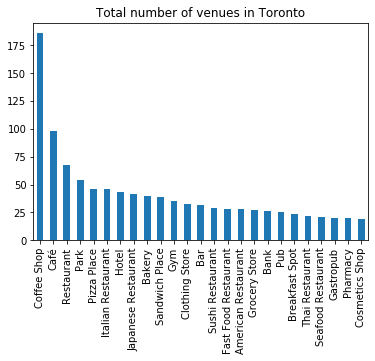

In [382]:
toronto_venues['Venue Category'].value_counts()[:25].plot(kind='bar',title='Total number of venues in Toronto')

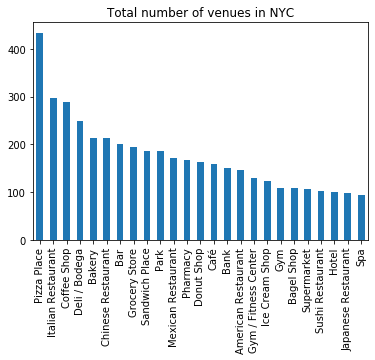

In [383]:
nyc_venues['Venue Category'].value_counts()[:25].plot(kind='bar',title='Total number of venues in NYC')

# --------------------------------------------------------------------------------------------------------
# PART 5: COMBINE / PREP NEW YORK & TORONTO DATA
# --------------------------------------------------------------------------------------------------------

### Step 12: Combine Toronto/NYC neighbourhood & venue data

In [110]:
#Combine Neighboorhood Data
df['City'] = 'Toronto'
nyc_neighborhoods['City'] = 'NYC'
all_cities = df.append(nyc_neighborhoods, ignore_index=True)
all_cities = all_cities[['City','Borough','Neighborhood','PostalCode','Latitude','Longitude']]

In [75]:
#Combine Venue Data
toronto_venues['City'] = 'Toronto'
nyc_venues['City'] = 'NYC'
venues_all = toronto_venues.append(nyc_venues, ignore_index=True)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,City
0,"Malvern , Rouge",43.806686,-79.194353,Wendy’s,43.807448,-79.199056,Fast Food Restaurant,Toronto
1,"Rouge Hill , Port Union , Highland Creek",43.784535,-79.160497,Royal Canadian Legion,43.782533,-79.163085,Bar,Toronto
2,"Guildwood , Morningside , West Hill",43.763573,-79.188711,RBC Royal Bank,43.766790,-79.191151,Bank,Toronto
3,"Guildwood , Morningside , West Hill",43.763573,-79.188711,G & G Electronics,43.765309,-79.191537,Electronics Store,Toronto
4,"Guildwood , Morningside , West Hill",43.763573,-79.188711,Big Bite Burrito,43.766299,-79.190720,Mexican Restaurant,Toronto


### Step 13: Perform one hot encoding to venue data and calculate relative means

In [66]:
# one hot encoding
venues_all_onehot = pd.get_dummies(venues_all[['Venue Category']], prefix="", prefix_sep="")
Venue_Cats = list(venues_all_onehot.columns)

# add city and neighbourhood column back to dataframe
#change spelling of neighbourhood, since this is a category in venue type
venues_all_onehot['City'] = venues_all['City'] 
venues_all_onehot['Neighbourhood'] = venues_all['Neighborhood'] 

# move city and neighborhood columns to the first two columns
venues_all_onehot = venues_all_onehot[['City']+['Neighbourhood']+Venue_Cats]
venues_all_onehot.head()

,City,Neighbourhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Gol

In [67]:
#group rows by neighborhood and by taking the mean of the frequency of occurrence of each category
all_grouped = venues_all_onehot.groupby(['City','Neighbourhood']).mean().reset_index()
all_grouped


,City,Neighbourhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Gol

### Step 14: Create table listing top 10 venues per Neighbourhood

In [443]:
# create list of columns "1st" to "10th Most Common Venue" venues
num_top_venues = 10
indicators = ['st', 'nd', 'rd']
columns = ['City','Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))
        
# create a new empty dataframe
all_venues_sorted = pd.DataFrame(columns=columns)
all_venues_sorted['City'] = all_grouped['City']
all_venues_sorted['Neighbourhood'] = all_grouped['Neighbourhood']


# function to extract a temp dataframe with all columns and 1 row (row is iterated in function call 
# transpose the table, sort the venues in descending order, extract top 10 into an array
# where no data exists, pad the array out with NaN values.
# return the array to populate the table, row by row
def return_most_common_venues(row, num_top_venues):
    del row['City']
    row.set_index('Neighbourhood',inplace=True)
    row = row.transpose() 
    row.columns.values[0] = 'rating'
    row = row[row['rating']>0]
    row_vals = row.index.values[0:num_top_venues]

    Loop_num = num_top_venues - len(row_vals)
    if Loop_num > 0:
        for x in range(Loop_num):
            row_vals = np.append(row_vals, [np.nan])

    return row_vals
        
# populate table
for ind in np.arange(all_grouped.shape[0]):
    all_venues_sorted.iloc[ind, 2:] = return_most_common_venues(all_grouped.iloc[[ind]], num_top_venues)

all_venues_sorted.head(10)

,City,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,NYC,Allerton,Breakfast Spot,Check Cashing Service,Chinese Restaurant,Cosmetics Shop,Deli / Bodega,Department Store,Dessert Shop,Discount Store,Donut Shop,Electronics Store
1,NYC,Annadale,American Restaurant,Bagel Shop,Diner,Food,Pizza Place,Restaurant,Sports Bar,Train Station,NaN,NaN
2,NYC,Arden Heights,Bus Stop,Coffee Shop,Deli / Bodega,Pharmacy,Pizza Place,NaN,NaN,NaN,NaN,NaN
3,NYC,Arlington,American Restaurant,Bus Stop,Deli / Bodega,Home Service,Intersection,NaN,NaN,NaN,NaN,NaN
4,NYC,Arrochar,Athletics & Sports,Bagel Shop,Bus Stop,Cosmetics Shop,Deli / Bodega,Food Truck,Hotel,Italian Restaurant,Mediterranean Restaurant,Middle Eastern Restaurant
5,NYC,Arverne,Beach,Board Shop,Bus Stop,Coffee Shop,Donut Shop,Metro Station,Pizza Place,Playground,Sandwich Place,Surf Spot
6,NYC,Astoria,American Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beer Garden,Brazilian Restaurant,Bubble Tea Shop,Café,Cajun / Creole Restaurant
7,NYC,Astoria Heights,Bakery,Bowling Alley,Burger Joint,Bus Station,Chinese Restaurant,Cocktail Bar,Food,Hostel,Italian Restaurant,Laundromat
8,NYC,Auburndale,American Restaurant,Athletics & Sports,Bar,Deli / Bodega,Discount Store,Fast Food Restaurant,Furniture / Home Store,Gymnastics Gym,Hookah Bar,Italian Restaurant
9,NYC,Bath Beach,Asian Restaurant,Bagel Shop,Bakery,Bank,Bubble Tea Shop,Burger Joint,Cantonese Restaurant,Chinese Restaurant,Clothing Store,Coffee Shop


# --------------------------------------------------------------------------------------------------------
# PART 6: CLUSTER AND VISUALISE DATA
# --------------------------------------------------------------------------------------------------------

### Step 15: Cluster neighborhoods and join onto summary venue table

In [444]:
# set number of clusters
kclusters = 10

all_grouped_clustering = all_grouped.drop(['City','Neighbourhood'], 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(all_grouped_clustering)

# add clustering labels to data
all_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:500] 

array([1, 1, 1, 4, 4, 4, 4, 4, 4, 1, 4, 4, 4, 1, 4, 3, 1, 4, 1, 4, 0, 1,
       1, 4, 4, 4, 4, 4, 1, 0, 4, 4, 1, 4, 1, 4, 7, 4, 1, 4, 4, 8, 8, 4,
       4, 1, 1, 4, 4, 4, 4, 4, 1, 4, 1, 3, 1, 4, 4, 1, 4, 1, 4, 1, 4, 1,
       4, 4, 1, 1, 4, 1, 4, 4, 4, 4, 4, 4, 4, 1, 1, 4, 4, 8, 1, 1, 4, 4,
       1, 4, 1, 4, 8, 1, 4, 4, 4, 4, 8, 1, 4, 4, 4, 4, 4, 4, 4, 1, 4, 4,
       4, 1, 1, 4, 4, 4, 1, 4, 1, 1, 4, 1, 4, 4, 1, 0, 4, 1, 1, 4, 4, 4,
       1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 1, 1, 8, 4, 4, 4, 4, 1,
       4, 4, 4, 1, 4, 1, 4, 4, 1, 4, 4, 4, 4, 1, 1, 1, 1, 4, 0, 4, 4, 1,
       1, 6, 4, 1, 1, 1, 1, 1, 1, 4, 0, 4, 4, 4, 1, 1, 4, 1, 1, 4, 1, 4,
       2, 1, 4, 4, 8, 1, 4, 4, 4, 1, 4, 1, 4, 1, 1, 4, 1, 1, 4, 1, 1, 4,
       4, 4, 1, 4, 4, 4, 8, 1, 4, 4, 4, 4, 4, 0, 0, 4, 4, 1, 1, 0, 1, 4,
       1, 0, 4, 4, 4, 4, 3, 1, 0, 1, 4, 4, 4, 3, 8, 4, 4, 1, 4, 4, 1, 4,
       1, 4, 4, 3, 4, 4, 4, 4, 4, 4, 1, 1, 4, 4, 1, 1, 4, 1, 4, 4, 4, 4,
       4, 1, 4, 1, 8, 4, 1, 4, 4, 1, 1, 1, 4, 4, 4,

In [445]:
## create a new dataframe that includes the clusters
## as well as the top 10 venues for each neighborhood and long/lat.

#create joinkeys
all_venues_sorted['Joinkey'] = all_venues_sorted['City'] + all_venues_sorted['Neighbourhood']
all_venues_sorted.set_index('Joinkey')
del all_venues_sorted['City']
del all_venues_sorted['Neighbourhood']

#create joinkeys
all_cities['Joinkey'] = all_cities['City'] + all_cities['Neighborhood']
all_cities.set_index('Joinkey')

#rename column on df table, prior to join
all_merged = all_cities.merge(all_venues_sorted, on='Joinkey', how='left', indicator=False)
del all_merged['Joinkey']

#Remove rows with NaN clusters - these exist where no venue data was obtained
Rows_incNAN = all_merged.shape[0]
print("No. of rows (including NaN clusters): ", Rows_incNAN)
all_merged = all_merged[~all_merged['Cluster Labels'].isnull()]
print("No. of rows (excluding NaN clusters): ", all_merged.shape[0])
print("No. of rows removed: ", all_merged.shape[0]-Rows_incNAN)

No. of rows (including NaN clusters):  409
No. of rows (excluding NaN clusters):  402
No. of rows removed:  -7


In [250]:
all_merged # check the last columns!

,City,Borough,Neighborhood,PostalCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Toronto,Scarborough,"Malvern , Rouge",M1B,43.806686,-79.194353,1.0,Fast Food Restaurant,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Toronto,Scarborough,"Rouge Hill , Port Union , Highland Creek",M1C,43.784535,-79.160497,2.0,Bar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Toronto,Scarborough,"Guildwood , Morningside , West Hill",M1E,43.763573,-79.188711,4.0,Bank,Breakfast Spot,Electronics Store,Intersection,Medical Center,Mexican Restaurant,Rental Car Location,NaN,NaN,NaN
3,Toronto,Scarborough,Woburn,M1G,43.770992,-79.216917,4.0,Coffee Shop,Insurance Office,Korean Restaurant,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Toronto,Scarborough,Cedarbrae,M1H,43.773136,-79.239476,8.0,Athletics & Sports,Bakery,Bank,Caribbean Restaurant,Fried Chicken Joint,Gas Station,Hakka Restaurant,Thai Restaurant,NaN,NaN
5,Toronto,Scarborough,Scarborough Village,M1J,43.744734,-79.239476,5.0,Convenience Store,Playground,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Toronto,Scarborough,"Kennedy Park , Ionview , East Birchmount Park",M1K,43.727929,-79.262029,4.0,Coffee Shop,Department Store,Discount Store,Hobby Shop,Train Station,NaN,NaN,NaN,NaN,NaN
7,Toronto,Scarborough,"Golden Mile , Clairlea , Oakridge",M1L,43.711112,-79.284577,4.0,Bakery,Bus Line,Bus Station,Ice Cream Shop,Intersection,Metro Station,Park,Soccer Field,NaN,NaN
8,Toronto,Scarborough,"Cliffside , Cliffcrest , Scarborough Village West",M1M,43.716316,-79.239476,4.0,American Restaurant,Motel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Toronto,Scarborough,"Birch Cliff , Cliffside West",M1N,43.692657,-79.264848,4.0,Café,College Stadium,General Entertainment,Skating Rink,NaN,NaN,NaN,NaN,NaN,NaN


### Step 16: Visualise clusters

In [251]:
address = 'Toronto'
latitude_TOR = 43.7869473
longitude_TOR = -79.385975

address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude_NY = location.latitude
longitude_NY = location.longitude

def map_my_data(map_clusters_name,latitude,longitude):
    # create map
    map_clusters_name = folium.Map(location=[latitude, longitude], zoom_start=11)

    # set color scheme for the clusters
    x = np.arange(kclusters)
    ys = [i + x + (i*x)**2 for i in range(kclusters)]
    colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
    rainbow = [colors.rgb2hex(i) for i in colors_array]

    # add markers to the map
    markers_colors = []
    for lat, lon, poi, cluster in zip(all_merged['Latitude'], all_merged['Longitude'], all_merged['Neighborhood'], all_merged['Cluster Labels']):
        label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[int(cluster)-1],
            fill=True,
            fill_color=rainbow[int(cluster)-1],
            fill_opacity=0.7).add_to(map_clusters_name)
    
    print('The geograpical coordinates are {}, {}.'.format(latitude, longitude))


In [252]:
map_my_data(map_clusters_name=map_clusters_CN,latitude=latitude_TOR,longitude=longitude_TOR)
map_clusters_CN

The geograpical coordinates are 43.7869473, -79.385975.


In [253]:
map_my_data(map_clusters_name=map_clusters_NY,latitude=latitude_NY,longitude=longitude_NY)
map_clusters_NY

The geograpical coordinates are 40.7127281, -74.0060152.


# --------------------------------------------------------------------------------------------------------
# PART 7: EXAMINE CLUSTERS
# --------------------------------------------------------------------------------------------------------

### Step 17: Analysis to create a table with total number of venues per cluster 

In [314]:
#Table 1
#Create a transposed table with a NewJoinKey (at the venue level-neighborhood-city level)
#This table contains all neighbourhoods per cluster, with top 10 venues only
df_melt = all_venues_sorted.melt(id_vars =['Joinkey','Cluster Labels'])  
df_melt = df_melt[~df_melt['value'].isnull()]
df_melt['New_PK'] = df_melt['Joinkey'] + df_melt['value']
df_melt.set_index('New_PK')

#Table 2
#Create a transposed table with a NewJoinKey (at the venue level-neighborhood-city level)
#This table contains all venues in all neighbourhoods
#Create a count of venue per neighbourhood
count_table = venues_all_onehot.groupby(['City','Neighbourhood']).sum().reset_index()
count_table['Joinkey'] = count_table['City'] + count_table['Neighbourhood']
count_melt = count_table.melt(id_vars =['Joinkey','City','Neighbourhood']) 
count_melt['New_PK'] = count_melt['City'] + count_melt['Neighbourhood'] + count_melt['variable']
count_melt.set_index('New_PK')
count_melt.rename(columns = {'value':'counts'}, inplace = True) 
del count_melt['variable']
count_melt = count_melt[count_melt['counts']!=0]

#Table 3
#Totals of Table 2 by City, Neighbourhood
count_melt2 = count_melt.copy()
count_melt2.reset_index(drop=True, inplace=True)
del count_melt2['New_PK']
del count_melt2['Neighbourhood']
del count_melt2['City']
tots_table = count_melt2.groupby(['Joinkey']).sum()
tots_table.rename(columns = {'counts':'total venues'}, inplace = True) 

#Table 4 = Table 1 + 2 + 3
#Join everything together
temp1 = count_melt.merge(tots_table, on='Joinkey', how='left', indicator=False)
del temp1['Joinkey']
stats_merged = df_melt.merge(temp1, on='New_PK', how='left', indicator=False)

#Generate Cluster Numbers
stats_short = stats_merged[['Cluster Labels','value','counts']]
stats_short_sum = stats_short.groupby(['Cluster Labels','value']).sum().reset_index()
stats_short_sum = stats_short_sum.sort_values(by=['Cluster Labels','counts'], ascending=False)
stats_short_sum.rename(columns = {'value':'Venue Category'}, inplace = True) 
stats_short_sum.reset_index(drop=True, inplace=True)
stats_short_sum.set_index('Cluster Labels', inplace=True)

In [331]:
print_width = 55

print('_'*print_width)
print('')
print('Frequency tables by cluster:')
print('_'*print_width)
print('')
print('')
    
for x in range(kclusters):
    string = "  CLUSTER " + str(x) + "  "
    new_string = string.center(print_width, '*')
    print('-'*print_width)
    print(new_string)
    print('-'*print_width)
    print('')
    print(stats_short_sum.loc[[x]])
    print('_'*print_width)
    print('')
    print('')

_______________________________________________________

Frequency tables by cluster:
_______________________________________________________


-------------------------------------------------------
*********************  CLUSTER 0  *********************
-------------------------------------------------------

                      Venue Category  counts
Cluster Labels                              
0                              Beach      31
0                      Deli / Bodega       7
0                         Bagel Shop       4
0                           Bus Stop       4
0                         Donut Shop       3
0                   Arepa Restaurant       2
0                          BBQ Joint       2
0                               Bank       2
0                                Bar       2
0                     Baseball Field       2
0                         Board Shop       2
0                        Bus Station       2
0                 Chinese Restaurant       2
0           

### Step 18: Examine top venues per neighbourhood in each cluster

In [265]:
#Examine Cluster Number 9
clust_num = 9
all_merged.loc[all_merged['Cluster Labels'] == clust_num]

,City,Borough,Neighborhood,PostalCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
91,Toronto,Etobicoke,"Old Mill South , King's Mill Park , Sunnylea ,...",M8Y,43.636258,-79.498509,9.0,Baseball Field,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
97,Toronto,North York,"Humberlea , Emery",M9M,43.724766,-79.532242,9.0,Baseball Field,Food Service,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [266]:
#Examine Cluster Number 8
clust_num = 8
all_merged.loc[all_merged['Cluster Labels'] == clust_num]

,City,Borough,Neighborhood,PostalCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,Toronto,Scarborough,Cedarbrae,M1H,43.773136,-79.239476,8.0,Athletics & Sports,Bakery,Bank,Caribbean Restaurant,Fried Chicken Joint,Gas Station,Hakka Restaurant,Thai Restaurant,NaN,NaN
29,Toronto,North York,"Northwood Park , York University",M3J,43.767980,-79.487262,8.0,Bar,Caribbean Restaurant,Coffee Shop,Massage Studio,Miscellaneous Shop,NaN,NaN,NaN,NaN,NaN
80,Toronto,York,"Del Ray , Mount Dennis , Keelsdale and Silvert...",M6M,43.691116,-79.476013,8.0,Caribbean Restaurant,Fast Food Restaurant,Fried Chicken Joint,Sandwich Place,NaN,NaN,NaN,NaN,NaN,NaN
81,Toronto,York,"Runnymede , The Junction North",M6N,43.673185,-79.487262,8.0,Breakfast Spot,Bus Line,Caribbean Restaurant,Pizza Place,NaN,NaN,NaN,NaN,NaN,NaN
105,NYC,Bronx,Eastchester,NaN,40.887556,-73.827806,8.0,Bowling Alley,Bus Station,Caribbean Restaurant,Chinese Restaurant,Deli / Bodega,Diner,Donut Shop,Fast Food Restaurant,Metro Station,Pizza Place
112,NYC,Bronx,Williamsbridge,NaN,40.881039,-73.857446,8.0,Bar,Caribbean Restaurant,Nightclub,Soup Place,NaN,NaN,NaN,NaN,NaN,NaN
144,NYC,Bronx,Olinville,NaN,40.871371,-73.863324,8.0,Basketball Court,Caribbean Restaurant,Deli / Bodega,Food,Fried Chicken Joint,Furniture / Home Store,Laundromat,Liquor Store,Supermarket,NaN
177,NYC,Brooklyn,Canarsie,NaN,40.635564,-73.902093,8.0,Asian Restaurant,Caribbean Restaurant,Chinese Restaurant,Deli / Bodega,Grocery Store,Gym,Thai Restaurant,NaN,NaN,NaN
178,NYC,Brooklyn,Flatlands,NaN,40.630446,-73.929113,8.0,Bar,Caribbean Restaurant,Deli / Bodega,Discount Store,Electronics Store,Fast Food Restaurant,Fried Chicken Joint,Lounge,Paper / Office Supplies Store,Park
268,NYC,Queens,St. Albans,NaN,40.694445,-73.758676,8.0,Café,Caribbean Restaurant,Chinese Restaurant,Convenience Store,Dance Studio,Deli / Bodega,Discount Store,Donut Shop,Fast Food Restaurant,Fried Chicken Joint


In [267]:
#Examine Cluster Number 7
clust_num = 7
all_merged.loc[all_merged['Cluster Labels'] == clust_num]

,City,Borough,Neighborhood,PostalCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
296,NYC,Queens,Brookville,NaN,40.660003,-73.751753,7.0,Deli / Bodega,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [268]:
#Examine Cluster Number 6
clust_num = 6
all_merged.loc[all_merged['Cluster Labels'] == clust_num]

,City,Borough,Neighborhood,PostalCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
179,NYC,Brooklyn,Mill Island,NaN,40.606336,-73.908186,6.0,Pool,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [269]:
#Examine Cluster Number 5
clust_num = 5
all_merged.loc[all_merged['Cluster Labels'] == clust_num]

,City,Borough,Neighborhood,PostalCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,Toronto,Scarborough,Scarborough Village,M1J,43.744734,-79.239476,5.0,Convenience Store,Playground,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
48,Toronto,Central Toronto,"Moore Park , Summerhill East",M4T,43.689574,-79.383160,5.0,Playground,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [270]:
#Examine Cluster Number 4
clust_num = 4
all_merged.loc[all_merged['Cluster Labels'] == clust_num]

,City,Borough,Neighborhood,PostalCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Toronto,Scarborough,"Guildwood , Morningside , West Hill",M1E,43.763573,-79.188711,4.0,Bank,Breakfast Spot,Electronics Store,Intersection,Medical Center,Mexican Restaurant,Rental Car Location,NaN,NaN,NaN
3,Toronto,Scarborough,Woburn,M1G,43.770992,-79.216917,4.0,Coffee Shop,Insurance Office,Korean Restaurant,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Toronto,Scarborough,"Kennedy Park , Ionview , East Birchmount Park",M1K,43.727929,-79.262029,4.0,Coffee Shop,Department Store,Discount Store,Hobby Shop,Train Station,NaN,NaN,NaN,NaN,NaN
7,Toronto,Scarborough,"Golden Mile , Clairlea , Oakridge",M1L,43.711112,-79.284577,4.0,Bakery,Bus Line,Bus Station,Ice Cream Shop,Intersection,Metro Station,Park,Soccer Field,NaN,NaN
8,Toronto,Scarborough,"Cliffside , Cliffcrest , Scarborough Village West",M1M,43.716316,-79.239476,4.0,American Restaurant,Motel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Toronto,Scarborough,"Birch Cliff , Cliffside West",M1N,43.692657,-79.264848,4.0,Café,College Stadium,General Entertainment,Skating Rink,NaN,NaN,NaN,NaN,NaN,NaN
10,Toronto,Scarborough,"Dorset Park , Wexford Heights , Scarborough To...",M1P,43.757410,-79.273304,4.0,Chinese Restaurant,Indian Restaurant,Pet Store,Vietnamese Restaurant,NaN,NaN,NaN,NaN,NaN,NaN
11,Toronto,Scarborough,"Wexford , Maryvale",M1R,43.750072,-79.295849,4.0,Auto Garage,Bakery,Breakfast Spot,Middle Eastern Restaurant,Sandwich Place,Shopping Mall,Smoke Shop,NaN,NaN,NaN
12,Toronto,Scarborough,Agincourt,M1S,43.794200,-79.262029,4.0,Breakfast Spot,Latin American Restaurant,Lounge,Skating Rink,NaN,NaN,NaN,NaN,NaN,NaN
17,Toronto,North York,Hillcrest Village,M2H,43.803762,-79.363452,4.0,Dog Run,Golf Course,Mediterranean Restaurant,Pool,NaN,NaN,NaN,NaN,NaN,NaN


In [271]:
#Examine Cluster Number 3
clust_num = 3
all_merged.loc[all_merged['Cluster Labels'] == clust_num]

,City,Borough,Neighborhood,PostalCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
14,Toronto,Scarborough,"Milliken , Agincourt North , Steeles East , L'...",M1V,43.815252,-79.284577,3.0,Park,Playground,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23,Toronto,North York,York Mills West,M2P,43.752758,-79.400049,3.0,Bank,Convenience Store,Park,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25,Toronto,North York,Parkwoods,M3A,43.753259,-79.329656,3.0,Food & Drink Shop,Park,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40,Toronto,East York,East Toronto,M4J,43.685347,-79.338106,3.0,Convenience Store,Park,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
44,Toronto,Central Toronto,Lawrence Park,M4N,43.728020,-79.388790,3.0,Bus Line,Park,Swim School,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50,Toronto,Downtown Toronto,Rosedale,M4W,43.679563,-79.377529,3.0,Park,Playground,Trail,NaN,NaN,NaN,NaN,NaN,NaN,NaN
64,Toronto,Central Toronto,Forest Hill North & West,M5P,43.696948,-79.411307,3.0,Jewelry Store,Park,Sushi Restaurant,Trail,NaN,NaN,NaN,NaN,NaN,NaN
73,Toronto,York,Humewood-Cedarvale,M6C,43.693781,-79.428191,3.0,Field,Hockey Arena,Park,Trail,NaN,NaN,NaN,NaN,NaN,NaN
74,Toronto,York,Caledonia-Fairbanks,M6E,43.689026,-79.453512,3.0,Park,Pool,Women's Store,NaN,NaN,NaN,NaN,NaN,NaN,NaN
79,Toronto,North York,"North Park , Maple Leaf Park , Upwood Park",M6L,43.713756,-79.490074,3.0,Bakery,Construction & Landscaping,Park,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [272]:
#Examine Cluster Number 2
clust_num = 2
all_merged.loc[all_merged['Cluster Labels'] == clust_num]

,City,Borough,Neighborhood,PostalCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Toronto,Scarborough,"Rouge Hill , Port Union , Highland Creek",M1C,43.784535,-79.160497,2.0,Bar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
63,Toronto,Central Toronto,Roselawn,M5N,43.711695,-79.416936,2.0,Garden,Ice Cream Shop,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
102,Toronto,Etobicoke,Northwest,M9W,43.706748,-79.594054,2.0,Bar,Drugstore,Rental Car Location,NaN,NaN,NaN,NaN,NaN,NaN,NaN
315,NYC,Staten Island,Oakwood,NaN,40.558462,-74.121566,2.0,Bar,Bus Station,Lawyer,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [273]:
#Examine Cluster Number 1
clust_num = 1
all_merged.loc[all_merged['Cluster Labels'] == clust_num]

,City,Borough,Neighborhood,PostalCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Toronto,Scarborough,"Malvern , Rouge",M1B,43.806686,-79.194353,1.0,Fast Food Restaurant,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13,Toronto,Scarborough,"Clarks Corners , Tam O'Shanter , Sullivan",M1T,43.781638,-79.304302,1.0,Bank,Chinese Restaurant,Coffee Shop,Fast Food Restaurant,Fried Chicken Joint,Gas Station,Italian Restaurant,Noodle House,Pharmacy,Pizza Place
15,Toronto,Scarborough,"Steeles West , L'Amoreaux West",M1W,43.799525,-79.318389,1.0,Bank,Breakfast Spot,Bubble Tea Shop,Chinese Restaurant,Coffee Shop,Cosmetics Shop,Fast Food Restaurant,Grocery Store,Gym,Indian Restaurant
34,Toronto,North York,Victoria Village,M4A,43.725882,-79.315572,1.0,Coffee Shop,French Restaurant,Hockey Arena,Pizza Place,Portuguese Restaurant,NaN,NaN,NaN,NaN,NaN
35,Toronto,East York,"Parkview Hill , Woodbine Gardens",M4B,43.706397,-79.309937,1.0,Athletics & Sports,Bank,Fast Food Restaurant,Gastropub,Gym / Fitness Center,Intersection,Pharmacy,Pizza Place,NaN,NaN
89,Toronto,Etobicoke,"Alderwood , Long Branch",M8W,43.602414,-79.543484,1.0,Coffee Shop,Gym,Pharmacy,Pizza Place,Pub,Sandwich Place,Skating Rink,NaN,NaN,NaN
99,Toronto,Etobicoke,Westmount,M9P,43.696319,-79.532242,1.0,Chinese Restaurant,Coffee Shop,Discount Store,Intersection,Middle Eastern Restaurant,Pizza Place,Sandwich Place,NaN,NaN,NaN
100,Toronto,Etobicoke,"Kingsview Village , St. Phillips , Martin Grov...",M9R,43.688905,-79.554724,1.0,Bus Line,Mobile Phone Shop,Pizza Place,Sandwich Place,NaN,NaN,NaN,NaN,NaN,NaN
101,Toronto,Etobicoke,"South Steeles , Silverstone , Humbergate , Jam...",M9V,43.739416,-79.588437,1.0,Beer Store,Coffee Shop,Fast Food Restaurant,Fried Chicken Joint,Grocery Store,Liquor Store,Pharmacy,Pizza Place,Sandwich Place,NaN
103,NYC,Bronx,Wakefield,NaN,40.894705,-73.847201,1.0,Dessert Shop,Donut Shop,Gas Station,Ice Cream Shop,Laundromat,Pharmacy,Pizza Place,Sandwich Place,NaN,NaN


In [274]:
#Examine Cluster Number 0
clust_num = 0
all_merged.loc[all_merged['Cluster Labels'] == clust_num]

,City,Borough,Neighborhood,PostalCode,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
188,NYC,Brooklyn,Sea Gate,NaN,40.576375,-74.007873,0.0,Beach,Bus Station,Spa,Video Store,NaN,NaN,NaN,NaN,NaN,NaN
275,NYC,Queens,Breezy Point,NaN,40.557401,-73.925512,0.0,Beach,Monument / Landmark,Supermarket,Trail,NaN,NaN,NaN,NaN,NaN,NaN
281,NYC,Queens,Rockaway Beach,NaN,40.582802,-73.822361,0.0,Arepa Restaurant,BBQ Joint,Bagel Shop,Bar,Beach,Beach Bar,Board Shop,Brazilian Restaurant,Burrito Place,Bus Stop
282,NYC,Queens,Neponsit,NaN,40.572037,-73.857547,0.0,Beach,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
293,NYC,Queens,Belle Harbor,NaN,40.576156,-73.854018,0.0,Bagel Shop,Bakery,Beach,Boutique,Chinese Restaurant,Deli / Bodega,Donut Shop,Italian Restaurant,Mexican Restaurant,Pharmacy
294,NYC,Queens,Rockaway Park,NaN,40.580343,-73.841534,0.0,Bagel Shop,Bank,Bar,Beach,Board Shop,Deli / Bodega,Diner,Donut Shop,French Restaurant,Gas Station
307,NYC,Staten Island,South Beach,NaN,40.580247,-74.079553,0.0,Athletics & Sports,Beach,Bus Stop,Deli / Bodega,Pier,NaN,NaN,NaN,NaN,NaN
335,NYC,Staten Island,Midland Beach,NaN,40.573527,-74.093483,0.0,Baseball Field,Basketball Court,Beach,Bus Stop,Chinese Restaurant,Deli / Bodega,Dessert Shop,Liquor Store,Restaurant,NaN
391,NYC,Queens,Roxbury,NaN,40.567376,-73.892138,0.0,Baseball Field,Beach,Deli / Bodega,Fast Food Restaurant,Irish Pub,Neighborhood,Trail,NaN,NaN,NaN
405,NYC,Queens,Hammels,NaN,40.587338,-73.805530,0.0,Beach,Building,Bus Station,Bus Stop,Deli / Bodega,Diner,Dog Run,Fast Food Restaurant,Food Truck,Fried Chicken Joint


In [490]:
all_clusters = all_merged[['Cluster Labels','City']]
NY_clusters = all_clusters[all_clusters['City'] == 'NYC']
TR_clusters = all_clusters[all_clusters['City'] == 'Toronto']

print("-"*40)
print("NY cluster counts")
print("-"*40)
print('Clus# ','Count')
print(NY_clusters['Cluster Labels'].value_counts())
print("-"*40)
print("")
print("-"*40)
print("Toronto clusters counts")
print("-"*40)
print('Clus# ','Count')
print(TR_clusters['Cluster Labels'].value_counts())
print("-"*40)

----------------------------------------
NY cluster counts
----------------------------------------
Clus#  Count
4.0    175
1.0    101
0.0     10
8.0     10
3.0      5
2.0      1
7.0      1
6.0      1
Name: Cluster Labels, dtype: int64
----------------------------------------

----------------------------------------
Toronto clusters counts
----------------------------------------
Clus#  Count
4.0    66
3.0    12
1.0     9
8.0     4
2.0     3
9.0     2
5.0     2
Name: Cluster Labels, dtype: int64
----------------------------------------


# --------------------------------------------------------------------------------------------------------
# PART 8: ASSESSMENT OF CLUSTER LABELS
# --------------------------------------------------------------------------------------------------------

### Step 19: From PART 6, determine the defining features of each cluster

#### Assessment of labels:

Common Clusters existing in both NYC and Toronto

    8  -- Caribbean/Chinese/Asian Restaurants, Fast Food, Delis/Bodegas, Cafes, Discount Stores [DIVERSE]
    4  -- Bars, Banks, Coffee Shops, Bakeries, All Types of Restaurant, Galleries, Gyms, Pubs, Hotels [DIVERSE]
    3  -- Playgrounds, Parks, Pharmacies, Fitness
    2  -- Bars
    1  -- Banks, Coffee Shops, Bus Stops, All Types of Restaurant, Bakeries Big Stores [DIVERSE]

    *Diverse clusters are defined as those with largely more than 2 types of venue in their neighbourhoods

Uncommon Clusters existing exclusively in NYC or Toronto

    9  -- Baseball / Food only [Toronto only]
    7  -- Deli/Bodegas only [NYC only]
    6  -- Pools only [NYC only]
    5  -- Playgrounds and Convenience Stores only [Toronto only]
    0  -- Beach locations, sports and monuments [NYC only]
